# Question 1: PCA SIFT (Edit for books)


•Compute the PCA-SIFT feature descriptors for the images given here (You can
ignore the second step).

• Modify the images by:

*   Scaling
*   Rotation
*   Gaussian blur

and obtain the keypoints for these images.

• Analyse the keypoints detected qualitatively and quantitatively (number of keypoints detected in each case).

In [3]:
import numpy as np
from skimage import io
from skimage.color import rgb2gray
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from scipy.ndimage import sobel
import cv2
from cv2 import resize
from google.colab.patches import cv2_imshow
from scipy.ndimage import maximum_filter, minimum_filter
from scipy.ndimage import rotate, zoom , gaussian_filter
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from tabulate import tabulate
from skimage.transform import rescale

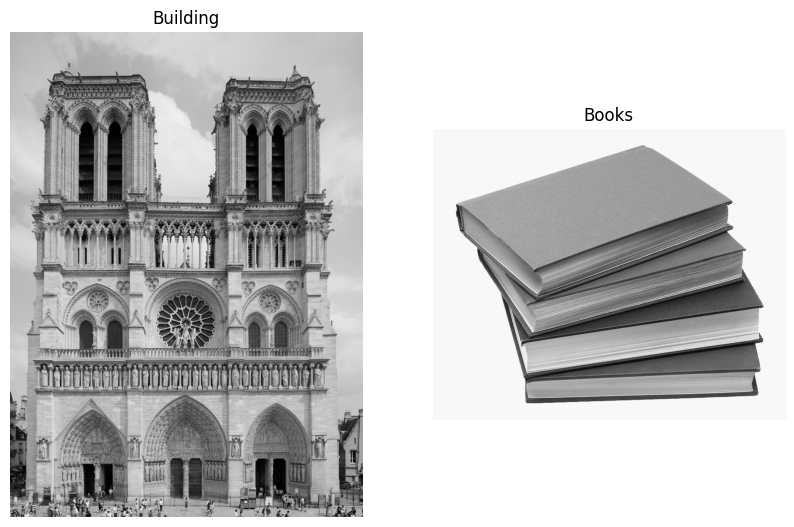

In [6]:
#Loading Images
building = rgb2gray(np.array(io.imread("/content/Building.png"))[:, :, :3])
books = rgb2gray(np.array(io.imread("/content/Books.png"))[:, :, :3])

fig,axis = plt.subplots(1,2,figsize = (10,10))

axis[0].imshow(building,cmap = 'gray')
axis[0].axis('off')
axis[0].set_title("Building")
axis[1].imshow(books,cmap = 'gray')
axis[1].axis('off')
axis[1].set_title('Books')
plt.show()

### Preprocessing:

In [4]:
def process_image(input_image):

    # Scale the image by a factor of 0.5
    scaled_image_05 = zoom(input_image, 0.5)

    # Scale the image by a factor of 2
    scaled_image_2 = zoom(input_image, 2)

    # Rotate the image by 90 degrees
    rotated_image = rotate(input_image, 90)

    # Apply Gaussian blur with sigma = 2
    blurred_image_2 = gaussian_filter(input_image, sigma=2)

    # Apply Gaussian blur with sigma = 3
    blurred_image_3 = gaussian_filter(input_image, sigma=3)

    # Display the images
    fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 5))
    images = [scaled_image_05, scaled_image_2, rotated_image, blurred_image_2, blurred_image_3]
    titles = ['Scaled Image (0.5x)', 'Scaled Image (2x)', 'Rotated Image', 'Blurred Image (Sigma = 2)', 'Blurred Image (Sigma = 3)']

    for i, ax in enumerate(axes):
        ax.imshow(images[i], cmap='gray')
        ax.set_title(titles[i])
        ax.axis('off')

    plt.show()

    return scaled_image_05, scaled_image_2, rotated_image, blurred_image_2, blurred_image_3




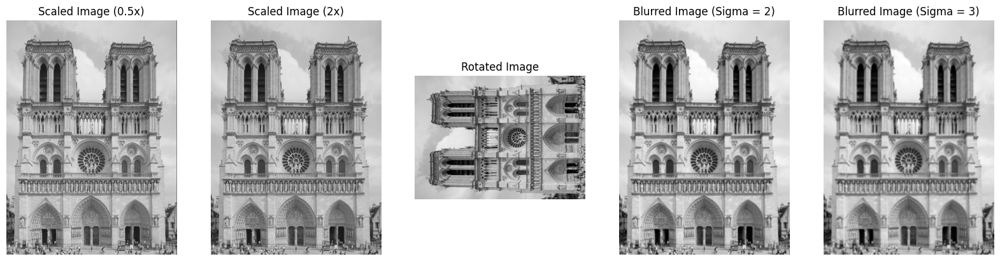

In [7]:
scaled_image_building_05, scaled_image_building_2, rotated_image_building, blurred_image_building_2, blurred_image_building_3 = process_image(building.copy())

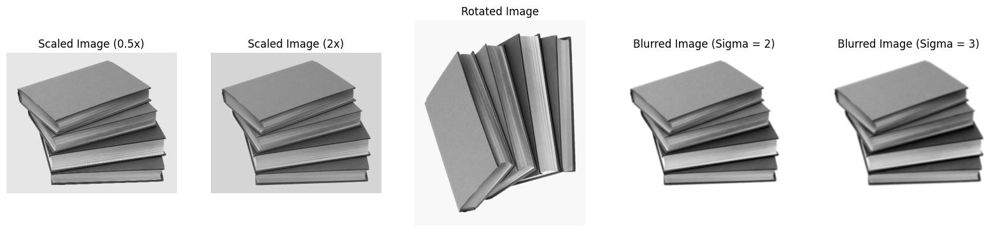

In [8]:
scaled_image_books_05, scaled_image_books_2, rotated_image_books, blurred_image_books_2, blurred_image_books_3 = process_image(books.copy())

# PCA-SIFT

## Step 1: Keypoint and Orientation angle detection:

In [9]:
def detector(current_layer, lower_layer, upper_layer, rows, columns, scale, octave_index, blurred_image, sigma, contrast_threshold):
    # Number of intervals in the scale space
    s = 5
    # Constant factor to increase the scale
    k = 2 ** (1 / (s - 1))
    # List to store the detected keypoints
    keypoints = []

    # Stack the lower, current, and upper layers to form a 3D array
    stacked_layers = np.stack([lower_layer, current_layer, upper_layer])

    # Apply the maximum and minimum filters to the 3D array
    max_filter = maximum_filter(stacked_layers, size=(3, 3, 3))
    min_filter = minimum_filter(stacked_layers, size=(3, 3, 3))

    # Find local maxima and minima in the 3D array
    local_maxima = (stacked_layers == max_filter)
    local_minima = (stacked_layers == min_filter)

    # Compute the gradient in x and y directions
    gx = sobel(blurred_image, axis=0)
    gy = sobel(blurred_image, axis=1)

    # Compute the gradient magnitude and orientation
    magnitude = np.sqrt(gx**2 + gy**2)
    orientation = np.arctan2(gy, gx) * 180 / np.pi % 360

    # Compute the scale and radius of the neighborhood for each keypoint
    scale_ = (sigma*octave_index) * (k ** scale)
    radius = int(round(3 * scale_))

    # Iterate over the current layer to detect keypoints
    for p in range(1, rows - 1):
        for q in range(1, columns - 1):

            # If the pixel is a local maximum and its absolute value is greater than the contrast threshold
            if local_maxima[1, p, q] and abs(current_layer[p, q]) > contrast_threshold:

                # Compute the histogram of gradient orientations within the neighborhood of the keypoint
                histogram, _ = np.histogram(
                    orientation[max(p - radius, 0):min(p + radius + 1, rows), max(q - radius, 0):min(q + radius + 1, columns)],
                    bins=36,
                    range=(0, 360),
                    weights=magnitude[max(p - radius, 0):min(p + radius + 1, rows), max(q - radius, 0):min(q + radius + 1, columns)]
                )

                # Find the bin with the maximum count and compute the orientation angle
                max_bin_index = np.argmax(histogram)
                orientation_angle = 5 + max_bin_index * 10
                keypoints.append([(p, q), scale , octave_index, orientation_angle])

            # If the pixel is a local minimum and its absolute value is greater than the contrast threshold
            elif local_minima[1, p, q] and abs(current_layer[p, q]) > contrast_threshold:

                # Compute the histogram of gradient orientations within the neighborhood of the keypoint
                histogram, _ = np.histogram(
                    orientation[max(p - radius, 0):min(p + radius + 1, rows), max(q - radius, 0):min(q + radius + 1, columns)],
                    bins=36,
                    range=(0, 360),
                    weights=magnitude[max(p - radius, 0):min(p + radius + 1, rows), max(q - radius, 0):min(q + radius + 1, columns)]
                )

                # Find the bin with the maximum count and compute the orientation angle
                max_bin_index = np.argmax(histogram)
                orientation_angle = 5 + max_bin_index * 10
                keypoints.append([(p, q), scale , octave_index, orientation_angle])

    # If no keypoints were detected, return None
    if len(keypoints) == 0:
        return None

    # Return the list of detected keypoints
    return keypoints

def detect_keypoints_and_orientation(image,sigma,octave_index):
  # Define the number of layers in the scale space
  s = 5  # s (5) : blurred image stack, s-1 (4) DOGs, s-3 (2) Scale_space_extrema_layers
   # Compute the constant factor k used in scale space construction
  k = 2 ** (1 / (s - 1)) # s layers

  # Generate a stack of blurred images with increasing levels of blur
  blurred_image_stack = [(gaussian_filter(image, (sigma * octave_index) * (k ** i)) * 255) for i in range(s)]

  # Compute the Difference of Gaussians (DoG) for each consecutive pair of blurred images
  DOGs = [(blurred_image_stack[i + 1] - blurred_image_stack[i]) for i in range(s-1)]

  extrema_list = []
   # Loop over the DoG layers
  for i in range(1,s-2):
    # Copy the current, upper and lower DoG layers
    lower_layer = DOGs[i-1].copy()
    current_layer = DOGs[i].copy()
    blurred_image = (blurred_image_stack[i-1]*255).copy()
    upper_layer = DOGs[i+1].copy()
     # Get the dimensions of the image
    rows = image.shape[0]
    columns = image.shape[1]
    # Define the scale
    scale = i

    # Detect extrema in the current DoG layer
    temp = detector(current_layer,lower_layer,upper_layer,rows,columns,scale,octave_index,blurred_image,sigma, contrast_threshold = 2)

    if temp != None:
      for x in temp:
        extrema_list.append(x)



  return extrema_list

def SIFT_keypoint_and_orientation_detector(image):
  # Initialize a list to store the final keypoints information
  final_keypoint_info = []
   # Loop over the octaves
  for octave in [1,2,4,8,16]:
    # Detect keypoints and their orientations in the current octave
    temp_keypoint_info = detect_keypoints_and_orientation(image,sigma = 1.6,octave_index = octave)

    if len(temp_keypoint_info) != 0:
      for x in temp_keypoint_info:
        final_keypoint_info.append(x)

  return final_keypoint_info


## Step 2: Descriptor detection using PCA:


In [10]:
def PCA_descriptor(image, keypoint_info):
    descriptors = []
    gradients = []
    coordinates = [keypoint[0] for keypoint in keypoint_info]  # Extract coordinates

    rows, columns = image.shape

    for keypoint in keypoint_info:
        i, j = keypoint[0]
        scale = keypoint[1]
        angle = keypoint[2]

        radius = int(20*scale)

        # Step 1: Take a 41 x 41 patch at the given scale, centered at the keypoint
        patch = image[max(i - radius, 0):min(i + radius + 1, rows), max(j - radius, 0):min(j + radius + 1, columns)]
        patch = cv2.resize(patch, (41, 41))

        # Normalize to a canonical direction
        patch = rotate(patch, -angle, reshape=False)

        # Step 2: Concatenate the horizontal and vertical gradients into a long vector
        gx = sobel(patch, axis=0)  # gradient in x direction
        gy = sobel(patch, axis=1)  # gradient in y direction

        #Removing Borders:
        gx = gx[1:-1,1:-1]
        gy = gy[1:-1,1:-1]

        gradient_vector = np.concatenate((gx.flatten(), gy.flatten()))

        # Step 3: Normalize vector to unit length
        gradient_vector = gradient_vector / np.linalg.norm(gradient_vector)

        gradients.append(gradient_vector)

    pca = PCA(n_components=100)
    descriptor = pca.fit_transform(gradients)
    print(len(descriptor))
    # Create a dictionary with coordinates as keys and descriptors as values
    coord_descriptor_dict = dict(zip(coordinates, descriptor))

    # Append the descriptor to the keypoint_info based on coordinates
    for i in range(len(keypoint_info)):
        keypoint_info[i].append(coord_descriptor_dict.get(keypoint_info[i][0]))

    return keypoint_info

## To Display Image with keypoints and Orientation

In [11]:
def show_keypoints_with_orientation(image, keypoint_info_new):
    s = 5
    k = 2 ** (1 / (s - 1))
    sigma = 1.6

    fig, ax = plt.subplots(figsize=(12, 12))  # Increase the size of the figure to 15x15 inches
    ax.imshow(image, cmap='gray')
    for point in keypoint_info_new:
        # Calculate the scale
        scale = sigma * point[2] * (k ** point[1])

        # Draw a circle around the keypoint
        circle = patches.Circle((point[0][1], point[0][0]), radius=scale, edgecolor='blue', facecolor='none')
        ax.add_patch(circle)

        # Draw a line indicating the orientation
        dx = np.cos(np.deg2rad(point[3])) * scale  # length of line along x-axis
        dy = np.sin(np.deg2rad(point[3])) * scale  # length of line along y-axis

        line = lines.Line2D([point[0][1], point[0][1] + dx], [point[0][0], point[0][0] + dy], color='magenta')
        ax.add_line(line)

    ax.axis('off')  # Turn off the axis
    plt.show()


# Main Function:

In [12]:
def PCA_SIFT(image):
  #Implementing Step 1:
  keypoint_info = SIFT_keypoint_and_orientation_detector(image)

  #Implementing Step 2:
  keypoint_info_with_descriptor = PCA_descriptor(image, keypoint_info)

  #Displaying image with its corresponding keypoints and orientation:
  show_keypoints_with_orientation(image.copy(), keypoint_info)

  return keypoint_info_with_descriptor

# Implementation

## Building Image:

### Original:

6621


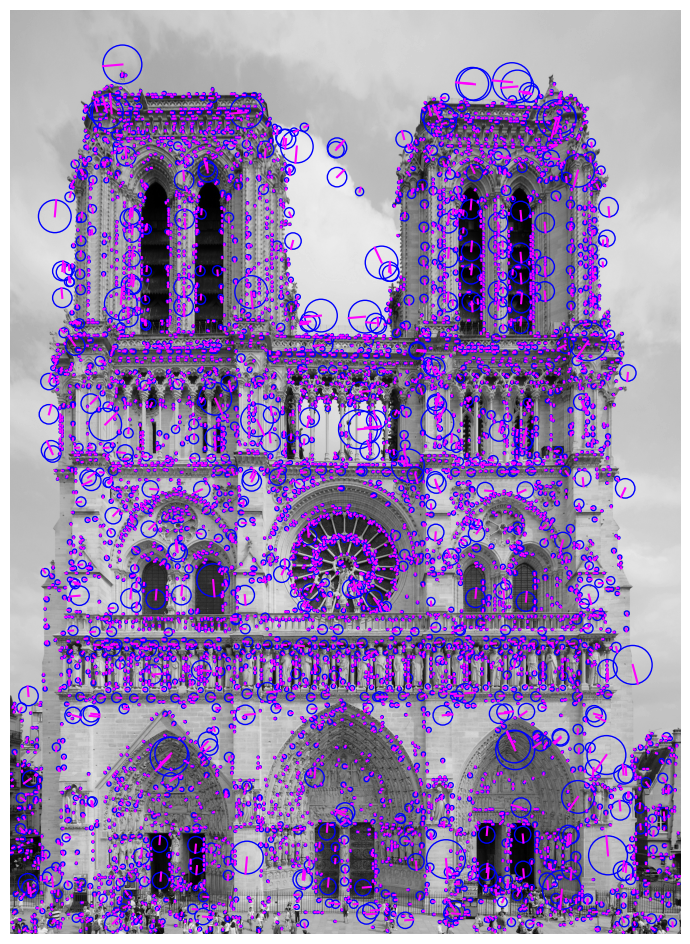

In [19]:
kpt_building_original = PCA_SIFT(building)
len_building_original = len(kpt_building_original)

### Scaled(x0.5):

1779


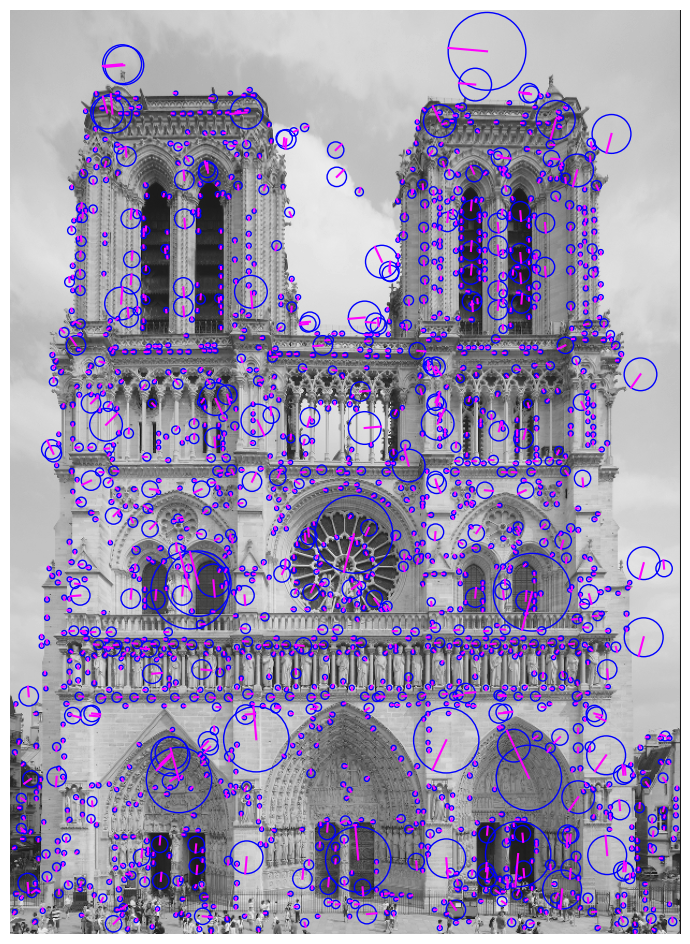

In [20]:
kpt_building_scaled_05 = PCA_SIFT(scaled_image_building_05)
len_building_scaled_05 = len(kpt_building_scaled_05)

### Scaled(x2):

28108


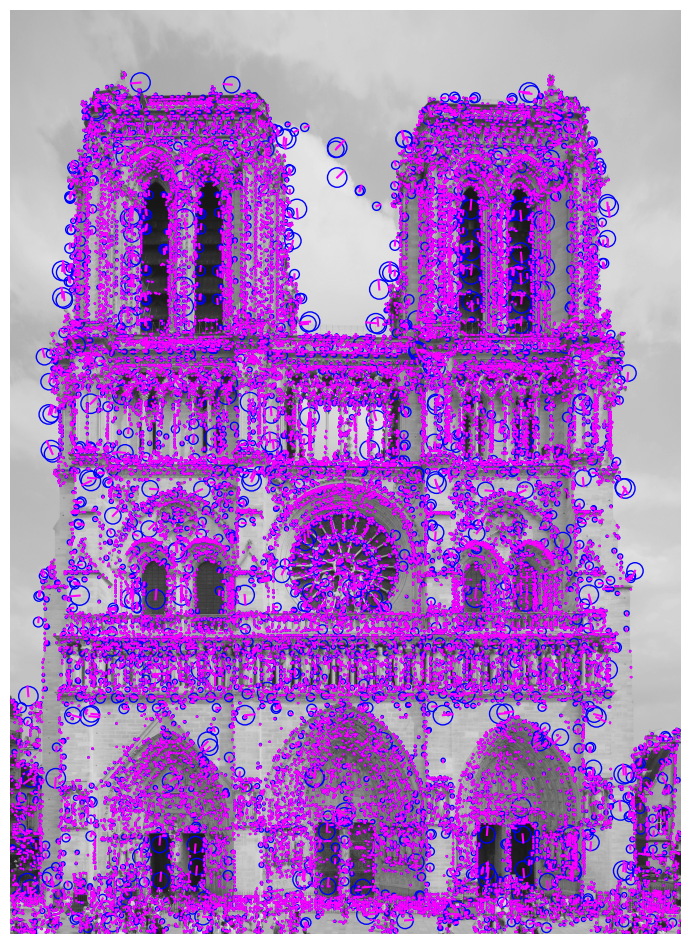

In [21]:
kpt_building_scaled_2 = PCA_SIFT(scaled_image_building_2)
len_building_scaled_2 = len(kpt_building_scaled_2)

### Rotated:

6621


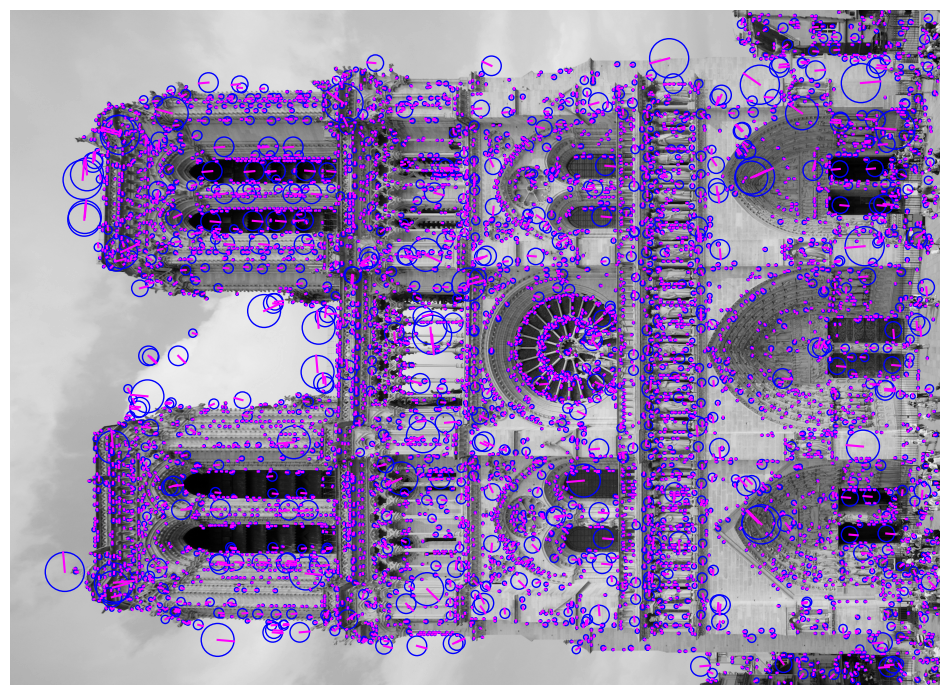

In [22]:
kpt_building_rotated = PCA_SIFT(rotated_image_building)
len_building_rotated = len(kpt_building_rotated)

### Blurred (sigma = 2):

3838


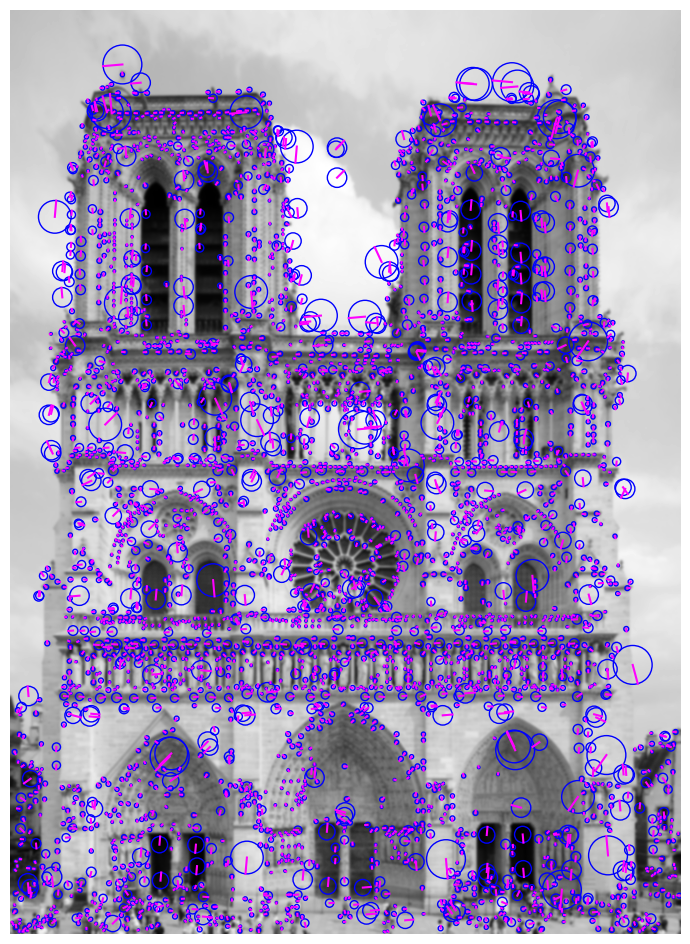

In [23]:
kpt_building_blurred_2 = PCA_SIFT(blurred_image_building_2)
len_building_blurred_2 = len(kpt_building_blurred_2)

### Blurred (sigma = 3):

1983


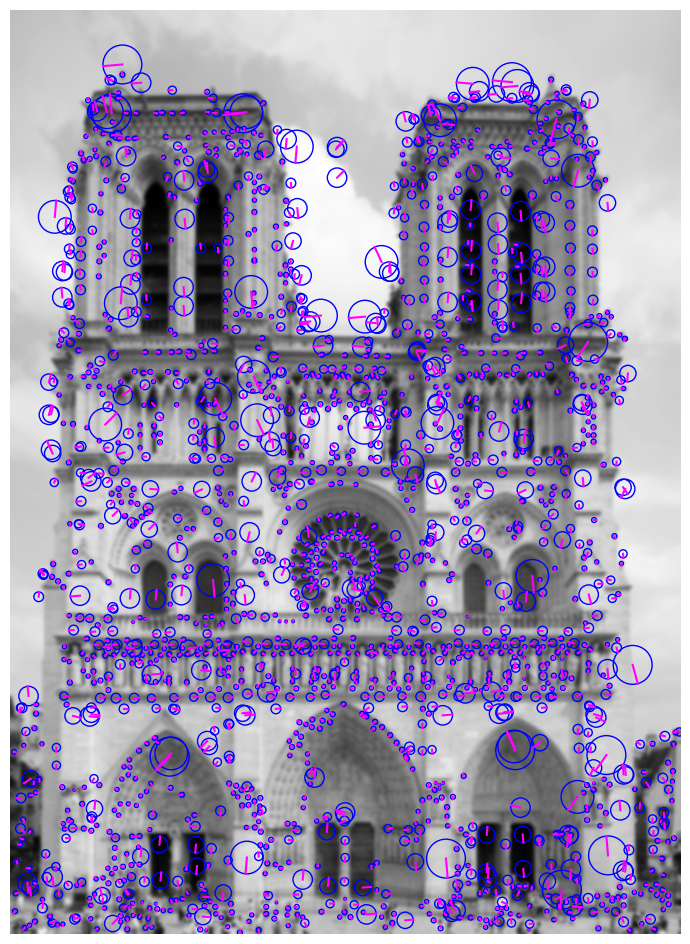

In [24]:
kpt_building_blurred_3 = PCA_SIFT(blurred_image_building_3)
len_building_blurred_3 = len(kpt_building_blurred_3)

## Books Image:

### Original:

1628


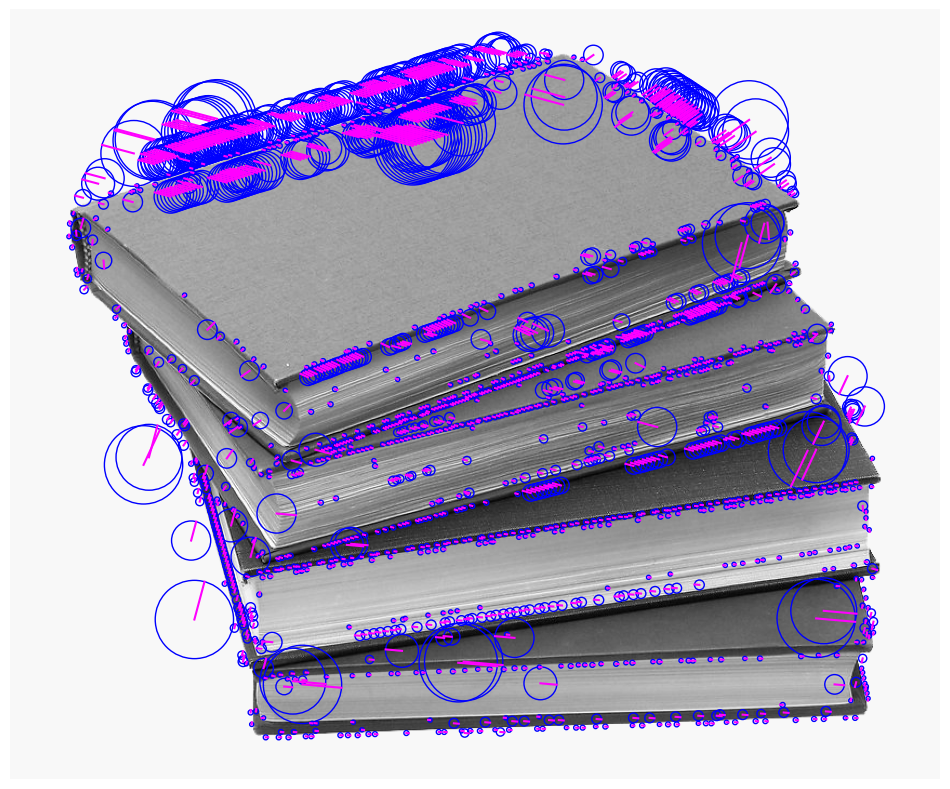

In [13]:
kpt_books_original = PCA_SIFT(books)
len_books_original = len(kpt_books_original)

### Scaled(x0.5):

482


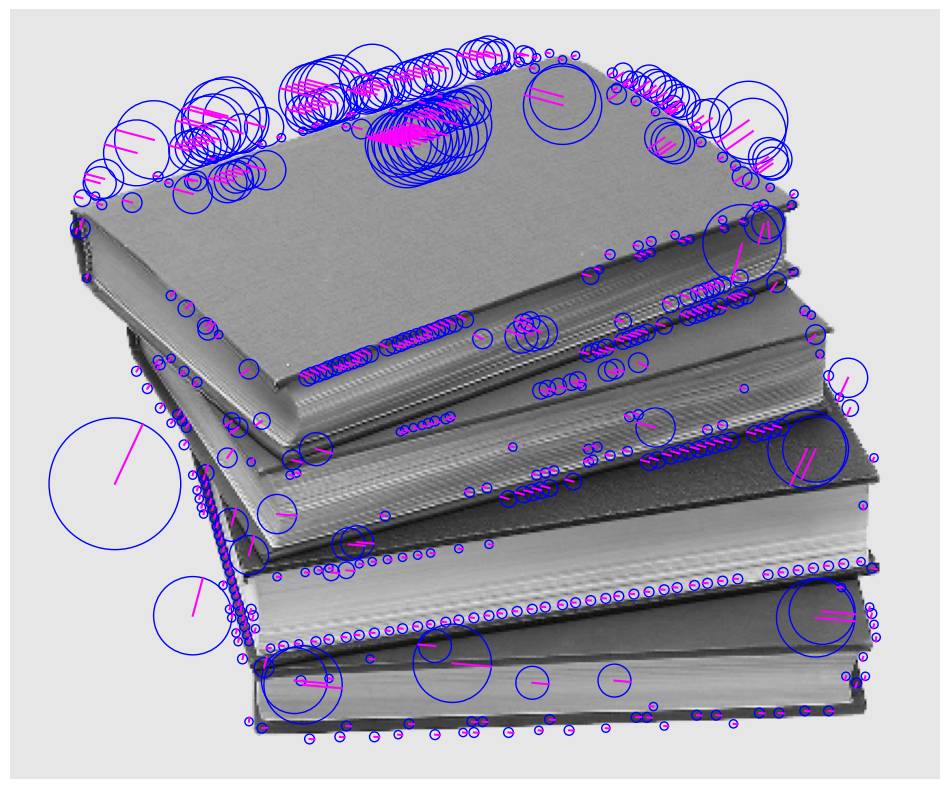

In [14]:
kpt_books_scaled_05 = PCA_SIFT(scaled_image_books_05)
len_books_scaled_05 = len(kpt_books_scaled_05)

### Scaled(x2):

3726


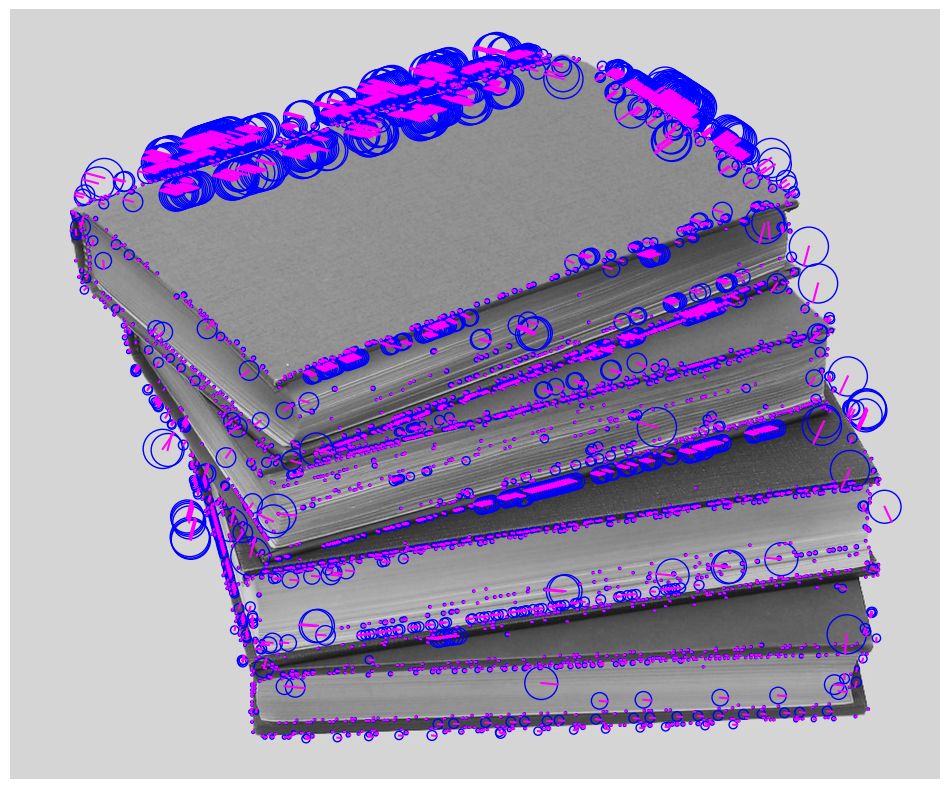

In [15]:
kpt_books_scaled_2 = PCA_SIFT(scaled_image_books_2)
len_books_scaled_2 = len(kpt_books_scaled_2)

### Rotated:

1628


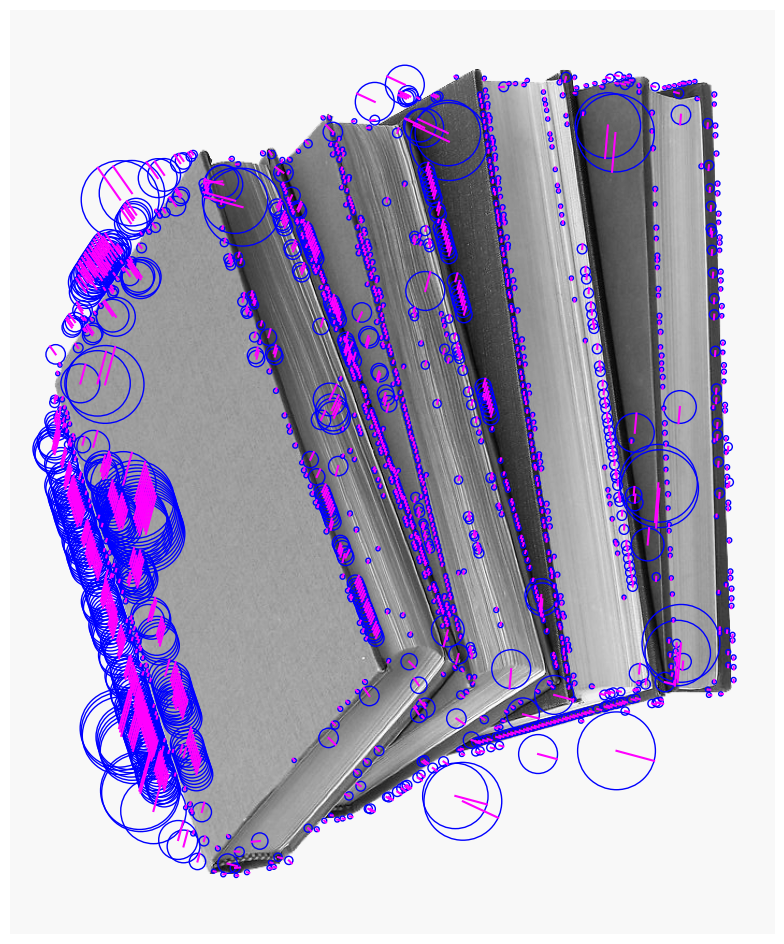

In [16]:
kpt_books_rotated = PCA_SIFT(rotated_image_books)
len_books_rotated = len(kpt_books_rotated)

### Blurred(sigma = 2):

837


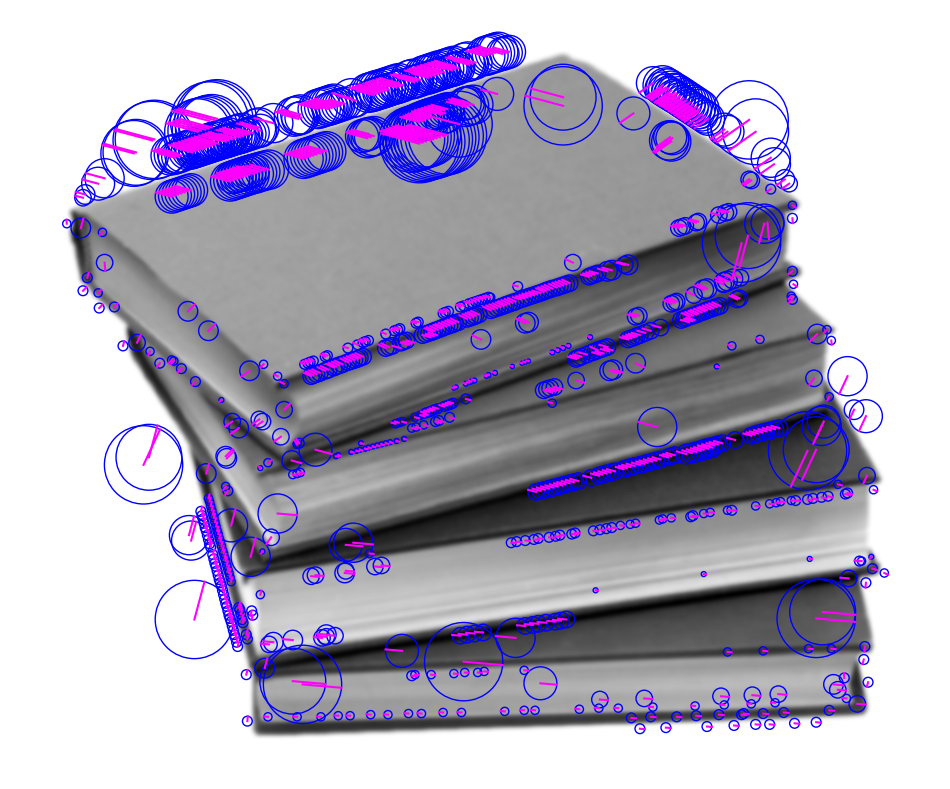

In [17]:
kpt_books_blurred_2 = PCA_SIFT(blurred_image_books_2)
len_books_blurred_2 = len(kpt_books_blurred_2)

### Blurred(sigma = 3):

661


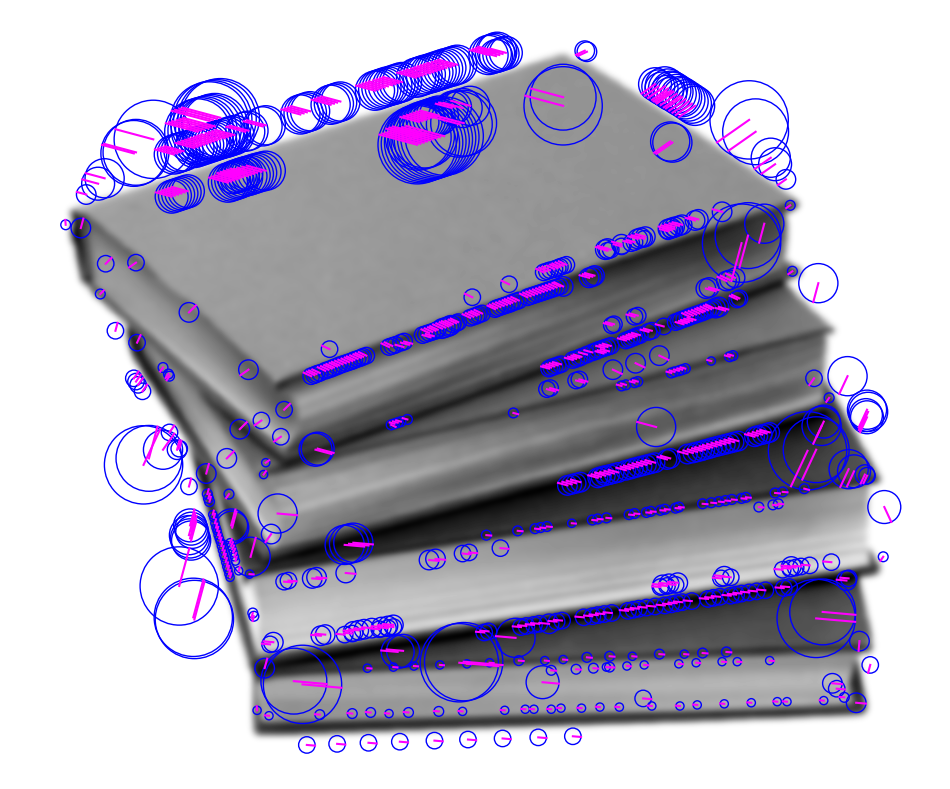

In [18]:
kpt_books_blurred_3 = PCA_SIFT(blurred_image_books_3)
len_books_blurred_3 = len(kpt_books_blurred_3)

# Summarizing:

In [27]:
table = [["Original",len_books_original,len_building_original],
        ["Rotation",len_books_rotated,len_building_rotated],
        ["Scaled(x0.5)",len_books_scaled_05,len_building_scaled_05],
        ["Scaled(x2)",len_books_scaled_2,len_building_scaled_2],
        ["Gaussian Blur(sigma = 2)",len_books_blurred_2,len_building_blurred_2],
        ["Gaussian Blur(sigma = 3)",len_books_blurred_3,len_building_blurred_3]]

headers = ["Type", "Books","Building"]
print(tabulate(table, headers, tablefmt="fancy_grid"))



╒══════════════════════════╤═════════╤════════════╕
│ Type                     │   Books │   Building │
╞══════════════════════════╪═════════╪════════════╡
│ Original                 │    1628 │       6621 │
├──────────────────────────┼─────────┼────────────┤
│ Rotation                 │    1628 │       6621 │
├──────────────────────────┼─────────┼────────────┤
│ Scaled(x0.5)             │     482 │       1779 │
├──────────────────────────┼─────────┼────────────┤
│ Scaled(x2)               │    3726 │      28108 │
├──────────────────────────┼─────────┼────────────┤
│ Gaussian Blur(sigma = 2) │     837 │       3838 │
├──────────────────────────┼─────────┼────────────┤
│ Gaussian Blur(sigma = 3) │     661 │       1983 │
╘══════════════════════════╧═════════╧════════════╛


# Printing Example Keypoints:

In [19]:
#Printing Example Keypoints:
print("\n\nkpt_building_original:\n")
print(kpt_building_original[0])
print("\n\nkpt_building_scaled_05:\n")
print(kpt_building_scaled_05[0])
print("\n\nkpt_building_rotated_2:\n")
print(kpt_building_scaled_2[0])
print("\n\nkpt_building_rotated:\n")
print(kpt_building_rotated[0])
print("\n\nkpt_building_blurred_2:\n")
print(kpt_building_blurred_2[0])


print("\n\nkpt_books_original:\n")
print(kpt_books_original[0])
print("\n\nkpt_books_scaled_05:\n")
print(kpt_books_scaled_05[0])
print("\n\nkpt_books_scaled_2:\n")
print(kpt_books_scaled_2[0])
print("\n\nkpt_books_rotated:\n")
print(kpt_books_rotated[0])
print("\n\nkpt_books_blurred_2:\n")
print(kpt_books_blurred_2[0])








kpt_building_original:

[(123, 208), 1, 1, 275, array([-1.95537199e-01, -2.64014477e-01, -7.66152506e-02,  5.15334268e-02,
        4.00293173e-02,  4.02996470e-02,  3.76177506e-02,  9.36047553e-03,
       -8.48456600e-02,  2.29879671e-02, -2.75139553e-02,  4.07425748e-02,
        2.47822649e-03,  3.84643359e-02,  9.27361777e-03,  1.88798735e-03,
        2.51822204e-02,  7.85179295e-03,  5.13819791e-02,  9.71810290e-03,
       -6.39654216e-02,  1.20653257e-03, -3.45425944e-02, -1.63174971e-02,
       -3.52400052e-02, -1.33781645e-02,  4.84285095e-04, -2.37742524e-02,
       -8.50516941e-03, -3.31937153e-02,  4.75379523e-02,  7.48748338e-02,
       -1.62793614e-02, -5.96646572e-03,  8.11480616e-02,  4.22105148e-02,
        3.04111329e-02,  7.69785962e-02, -1.58449724e-02, -3.70594398e-02,
        2.03524975e-03,  2.91637915e-02, -5.48082221e-02,  4.89130528e-02,
       -4.20232329e-02, -2.01850406e-04,  4.00804872e-02,  1.44445525e-02,
       -1.21626397e-02, -1.46063018e-02,  4.568173